# Unsupervised Anomaly Detection on fastMRI

### *Run these cells only when in Google Colab*

In [ ]:
# # Clone the repository
# !git clone https://github.com/compai-lab/mad_seminar_s23.git
# # Move all content to the current directory
# !mv ./mad_seminar_s23/* ./
# # Remove the empty directory
# !rm -rf mad_seminar_s23/

In [1]:
# # Download the data
#!wget https://syncandshare.lrz.de/dl/fiH6r4B6WyzAaxZXTEAYCE/data.zip
# # Extract the data
#!unzip -q ./data.zip
#!conda install --yes pytorch torchvision -c pytorch


In [1]:
# # Install additional packages
!pip install pytorch_lightning --quiet
!pip install lpips
import torch
import matplotlib.pyplot as plt
import pytorch_lightning as pl
import yaml

ModuleNotFoundError: No module named 'torch'

## Imports

In [2]:
from models.model import get_model
from data_loader import TrainDataModule, get_all_test_dataloaders
import os    
os.environ['KMP_DUPLICATE_LIB_OK'] = 'True'
# autoreload imported modules
%load_ext autoreload
%autoreload 2

## Load the config

In [4]:
import torch

# Check if GPU is available
print(torch.cuda.is_available())

with open('./configs/nae_config.yaml', 'r') as f:
    config = yaml.safe_load(f)

# Reproducibility
pl.seed_everything(config['seed'])

Seed set to 42


False


42

## Load and visualize the data

Using 581 IXI images and 130 fastMRI images for training. Using 15 images for validation.
Batch shape: torch.Size([64, 1, 128, 128])
Batch min: 0.0
Batch max: 1.0


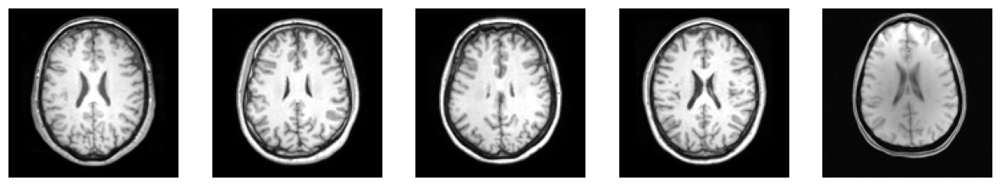

In [5]:
train_data_module = TrainDataModule(
    split_dir=config['split_dir'],
    target_size=config['target_size'],
    batch_size=config['batch_size'])

# Plot some images
batch = next(iter(train_data_module.train_dataloader()))

# Print statistics
print(f"Batch shape: {batch.shape}")
print(f"Batch min: {batch.min()}")
print(f"Batch max: {batch.max()}")

fig, ax = plt.subplots(1, 5, figsize=(15, 5))
for i in range(5):
    ax[i].imshow(batch[i].squeeze(), cmap='gray')
    ax[i].axis('off')
plt.show()


## Tensorboard

In [6]:
%load_ext tensorboard
%tensorboard --logdir lightning_logs/

ERROR: Could not find `tensorboard`. Please ensure that your PATH
contains an executable `tensorboard` program, or explicitly specify
the path to a TensorBoard binary by setting the `TENSORBOARD_BINARY`
environment variable.

## Prepare model

In [5]:
# Init model

model = get_model(config)

# Use tensorboard logger and CSV logger
trainer = pl.Trainer(
    max_epochs=config['num_epochs'],
    logger=[
        pl.loggers.TensorBoardLogger(save_dir='./'),
        pl.loggers.CSVLogger(save_dir='./')
    ],
)

Loading model AE


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


## NAE Trainer

In [5]:
from models.modules import ConvNet2FC, DeConvNet2, ConvNet64,DeConvNet64
from models.nae import NAE_L2_OMI

from models.mcmc import LangevinSampler
encoder = ConvNet64(
            in_chan=1,
            out_chan=128,
            nh=32,
            num_groups=None,
            use_bn=False,
            out_activation='linear',
            activation='relu'
        )
decoder =  net = DeConvNet64(
            in_chan=128, out_chan=1, nh=8,num_groups=None,use_bn=False, out_activation='sigmoid'
        )
sampler_z=LangevinSampler(n_step= 10,
      stepsize= 0.2,
      noise_std= 0.05,
      noise_anneal= None,
      clip_langevin_grad= None,
      buffer_size= 10000,
      replay_ratio= 0.95,
      mh= False,
      bound= 'spherical', 
      initial_dist= 'uniform_sphere')
sampler_x= LangevinSampler(n_step= 10,
      stepsize= 10,
      noise_std= 0.05,
      noise_anneal= 1,
      clip_langevin_grad= 0.01,
      mh= False,
      buffer_size= 0,
      bound= [0, 1])
model =  NAE_L2_OMI(encoder, decoder, sampler_z,sampler_x, gamma= 1, l2_norm_reg_de= None, l2_norm_reg_en= 0.0001, T= 1.).to('cuda')

AssertionError: Torch not compiled with CUDA enabled

## Training for NAE

In [6]:
from torch.optim import SGD, Adam
from tqdm import tqdm
from metrics import averageMeter
from torchvision.utils import make_grid, save_image
import torchvision.transforms as transforms
from PIL import Image
import time
import os
import numpy as np
import cv2

device='cuda'
from sklearn.metrics import roc_auc_score
def roc_btw_arr(arr1, arr2):
    true_label = np.concatenate([np.ones_like(arr1),
                                 np.zeros_like(arr2)])
    score = np.concatenate([arr1, arr2])
    return roc_auc_score(true_label, score)

def predict(self, m, dl, device, flatten=False):
    """run prediction for the whole dataset"""
    l_result = []
    for x, _ in dl:
        with torch.no_grad():
            if flatten:
                x = x.view(len(x), -1)
            pred = m.predict(x.cuda(device)).detach().cpu()
        l_result.append(pred)
    return torch.cat(l_result)

def save_model(model, best=False, i_iter=None, i_epoch=None):
    logdir="./logdir/"
    if best:
        pkl_name = "model_best.pkl"
    else:
        if i_iter is not None:
            pkl_name = "model_iter_{}.pkl".format(i_iter)
        else:
            pkl_name = "model_epoch_{}.pkl".format(i_epoch)
    state = {"epoch": i_epoch, "model_state": model.state_dict(), 'iter': i_iter}
    save_path = os.path.join(logdir, pkl_name)
    torch.save(state, save_path)
    print(f'Model saved: {pkl_name}')


print_interval= 100
val_interval= 200
save_interval= 2000
save_interval_epoch= 2000
ae_lr= 1.0e-4
nae_lr= 1.0e-5
temperature_lr= 1.0e-3
print_interval_nae=10

best_val_loss = np.inf
time_meter = averageMeter()
i = 0
indist_train_loader = train_data_module.train_dataloader()
#print(indist_train_loader.shape)
indist_val_loader = train_data_module.val_dataloader()
no_best_model_tolerance = 3
no_best_model_count = 0

n_ae_epoch = 5
n_nae_epoch = 1

ae_opt = ae_opt = Adam(model.parameters(), lr=ae_lr)
l_params = [{'params': list(model.encoder.parameters()) + list(model.decoder.parameters())}]
nae_opt = Adam(l_params, lr=nae_lr)

#AE run
for i_epoch in range(n_ae_epoch):

    for x in indist_train_loader:
        i += 1

        model.train()
        x = x.to(device)
        #y = y.to(device)
        
        start_ts = time.time()
        d_train = model.train_step_ae(x, ae_opt)
        time_meter.update(time.time() - start_ts)
    print(i_epoch, ". epoch")
        
       

    if i_epoch % save_interval_epoch == 1:
        save_model(model, best=False, i_iter=None, i_epoch=i_epoch)
        print(f'Epoch [{i_epoch:d}] model saved {save_interval_epoch}')

    if no_best_model_count > no_best_model_tolerance:
        print('terminating autoencoder training since validation loss does not decrease anymore')
        break

'''NAE PASS'''
i = 0
for i_epoch in tqdm(range(n_nae_epoch)):
    for x in tqdm(indist_train_loader):
        i += 1

        x = x.to(device)
        # from pudb import set_trace; set_trace()
        d_result = model.train_step(x, nae_opt)
        #logger.process_iter_train(d_result)
        print("bir resim gecti")

        if i % print_interval_nae == 1:
            input_img = make_grid(x.detach().cpu(), nrow=10)
            recon_img = make_grid(model.reconstruct(x).detach().cpu(), nrow=10)

            grid_image_input = transforms.ToPILImage()(input_img).convert("RGB")
            grid_image_recon = transforms.ToPILImage()(recon_img).convert("RGB")
            grid_image_input.save('input_image.png')
            grid_image_recon.save('recon_image.png')
            #logger.d_train['input_img@'] = input_img
            #logger.d_train['recon_img@'] = recon_img
            #logger.summary_train(i)

#        if i % val_interval == 1:
 #           '''AUC'''
 #           in_pred = predict(model, indist_val_loader, device)
 #           ood1_pred = predict(model, oodval_val_loader, device)
 #           auc_val = roc_btw_arr(ood1_pred, in_pred)
 #           ood2_pred = predict(model, oodtarget_val_loader, device)
 #           auc_target = roc_btw_arr(ood2_pred, in_pred)
 #           d_result = {'nae/auc_val_': auc_val, 'nae/auc_target_': auc_target}
 #           #logger.process_iter_val(d_result)
 #           #print(logger.summary_val(i)['print_str'])
 #           torch.save({'model_state': model.state_dict()}, f'{logdir}/nae_iter_{i}.pkl')
    #torch.save(model.state_dict(), f'./logdir/nae_{i_epoch}.pkl')
#torch.save(model.state_dict(), f'./logdir/nae.pkl')

'''AUC'''
#in_pred = predict(model, indist_val_loader, device)
#ood1_pred = predict(model, oodval_val_loader, device)
#auc_val = roc_btw_arr(ood1_pred, in_pred)
#ood2_pred = predict(model, oodtarget_val_loader, device)
#auc_target = roc_btw_arr(ood2_pred, in_pred)
#d_result = {'nae/auc_val': auc_val, 'nae/auc_target': auc_target}
#print(d_result)

print("auc_val= ")


ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
Model saved: model_epoch_1.pkl
Epoch [1] model saved 2000
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
ilk_resim
il

100%|██████████| 1/1 [13:25<00:00, 805.97s/it]

auc_val= 


## Run training

In [ ]:
from trainer import NAE_Trainer
nae_trainer= NAE_Trainer(config=config,device='cuda',train_data_module=train_data_module)
nae_trainer.train()

## Evaluation

In [22]:
# Reconstructions from the validation set
batch = next(iter(train_data_module.val_dataloader()))
def detect_anomaly(model, x):
        x=x.to('cuda')
        z = model.encode(x)
        rec = model.decoder(z)
        anomaly_map = torch.abs(x - rec)
        anomaly_score = torch.sum(anomaly_map, dim=(1, 2, 3))
        return {
            'reconstruction': rec,
            'anomaly_map': anomaly_map,
            'anomaly_score': anomaly_score
        }
with torch.inference_mode():
    results = detect_anomaly(nae_trainer.model,batch)
    reconstructions = results['reconstruction']
    anomaly_map=results['anomaly_map']
plt.figure().clear()
plt.close()
plt.cla()
plt.clf()
# Plot images and reconstructions
plt.close(fig)
fig, ax = plt.subplots(2, 5, figsize=(15, 5))
for i in range(5):
    ax[0][i].imshow(batch[i].squeeze(), cmap='gray')
    ax[0][i].axis('off')
    ax[1][i].imshow(reconstructions[i].cpu().squeeze(), cmap='gray')
    ax[1][i].axis('off')
    


## Visualize pathology and labels

In [9]:
# Get test dataloaders
test_dataloaders = get_all_test_dataloaders(config['split_dir'], config['target_size'], config['batch_size'])

In [21]:
diseases = ['absent_septum', 'edema', 'enlarged_ventricles', 'mass', 'dural']
plt.figure().clear()
plt.close()
plt.cla()
plt.clf()
fig, ax = plt.subplots(3, len(diseases), figsize=(15, 5))
for i in range(len(diseases)):
    batch = next(iter(test_dataloaders[diseases[i]]))
    inputs, pos_labels, neg_masks = batch
    ax[0][i].imshow(inputs[i].squeeze(), cmap='gray')
    ax[0][i].axis('off')
    ax[1][i].imshow(pos_labels[i].squeeze(), cmap='gray')
    ax[1][i].axis('off')
    ax[2][i].imshow(neg_masks[i].squeeze(), cmap='gray')
    ax[2][i].axis('off')
    ax[0][i].set_title(diseases[i])


In [12]:
from evaluate import Evaluator 

evaluator = Evaluator(model, 'cpu', test_dataloaders)

metrics, fig_metrics, fig_example = evaluator.evaluate()

Setting up [LPIPS] perceptual loss: trunk [squeeze], v[0.1], spatial [on]
Loading model from: c:\Users\ereys\anaconda3\envs\myenv\Lib\site-packages\lpips\weights\v0.1\squeeze.pth
Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


c:\Users\ereys\anaconda3\envs\myenv\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\ereys\anaconda3\envs\myenv\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=SqueezeNet1_1_Weights.IMAGENET1K_V1`. You can also use `weights=SqueezeNet1_1_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
c:\Users\ereys\anaconda3\envs\myenv\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNe

Loading model from: c:\Users\ereys\anaconda3\envs\myenv\Lib\site-packages\lpips\weights\v0.1\alex.pth
******************* DATASET: absent_septum ****************


IndexError: invalid index of a 0-dim tensor. Use `tensor.item()` in Python or `tensor.item<T>()` in C++ to convert a 0-dim tensor to a number

In [13]:
fig_metrics.keys()

dict_keys(['L1', 'LPIPS', 'SSIM', 'TP', 'FP', 'Precision', 'Recall', 'F1'])

In [14]:
fig_metrics['F1']

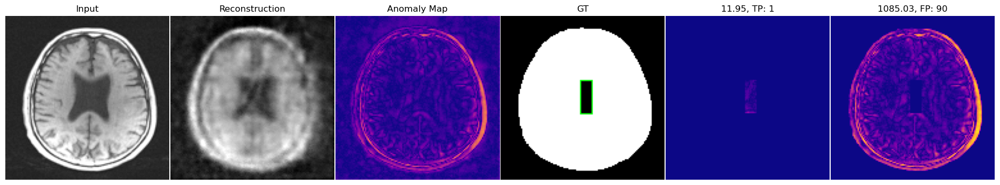

In [15]:
fig_example